In [2]:
import pandas as pd

In [8]:
 pd.read_csv("music.csv")

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...
...,...,...,...,...
7518,Hanson,My Own Sweet Time,/h/hanson/my+own+sweet+time_20579405.html,"Hello, goodbye my friend \r\nFeels like the s..."
7519,Hanson,Need You Now,/h/hanson/need+you+now_20579404.html,Your deep brown eyes \r\nThey watch me as I s...
7520,Hanson,Never Let Go,/h/hanson/never+let+go_20287064.html,Just lay down \r\nAnd let your worries sleep ...
7521,Hanson,Never Love Again,/h/hanson/never+love+again_20579403.html,Just a simple conversation \r\nBut I've memor...


In [12]:
df = pd.read_csv("music.csv")

In [13]:
df.head(5)

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...


In [14]:
df.tail(5)

,artist,song,link,text
7518,Hanson,My Own Sweet Time,/h/hanson/my+own+sweet+time_20579405.html,"Hello, goodbye my friend \r\nFeels like the s..."
7519,Hanson,Need You Now,/h/hanson/need+you+now_20579404.html,Your deep brown eyes \r\nThey watch me as I s...
7520,Hanson,Never Let Go,/h/hanson/never+let+go_20287064.html,Just lay down \r\nAnd let your worries sleep ...
7521,Hanson,Never Love Again,/h/hanson/never+love+again_20579403.html,Just a simple conversation \r\nBut I've memor...
7522,Hanson,One M,NaN,NaN


In [15]:
df.shape

(7523, 4)

In [16]:
df.isnull().sum()

artist    0
song      0
link      1
text      1
dtype: int64

In [17]:
df =df.sample(5000).drop('link', axis=1).reset_index(drop=True)

In [18]:
df.head(10)

,artist,song,text
0,Bing Crosby,Swingin' Down The Lane,Everybody hand in hand \r\nSwingin' down the ...
1,Elvis Presley,Confidence,When everyone thought the world was flat \r\n...
2,Chicago,"Come To Me, Do","Come to me, lonely \r\nCome to me, blue \r\n..."
3,Fabolous,Special Delivery Freestyle,[Fabolous:] \r\nYeah please believe it \r\nB...
4,Dusty Springfield,No Easy Way Down,"With the music of life, my soul is out of tune..."
5,Ellie Goulding,Guns And Horses,You're so quiet \r\nBut it doesn't faze me \...
6,Chaka Khan,Miles Blowin,I'm in such a mood \r\nTurned on by the thoug...
7,Bob Seger,Cat,"Daughter, daughter, don't do that, don't do th..."
8,Elvis Costello,Human Hands,I've been talking to the wall and it's been an...
9,Eric Clapton,Got You On My Mind,"I've got you on my mind, I'm feeling kind of s..."


In [19]:
df['text'][0]

"Everybody hand in hand  \r\nSwingin' down the lane  \r\nEverybody's feelin' grand  \r\nSwingin' down the lane  \r\n  \r\nThat's the time I miss that bliss  \r\nThat we might have known  \r\nNights like this when I'm all alone  \r\n  \r\nWhen the moon is on the rise  \r\nHoney, I am so blue  \r\nWatchin' lovers makin' eyes  \r\nLike we used to do  \r\n  \r\nWhen the moon is on the way  \r\nStill I'm waitin' all in vain  \r\nShould be swingin' down that lane with you  \r\n  \r\nWhen the moon is on the rise  \r\nHoney, I am so blue  \r\nWatchin' lovers makin' eyes  \r\nLike we used to do  \r\n  \r\nWhen the moon is on the way  \r\nStill I'm waitin' all in vain  \r\nShould be swingin' down that lane with you\r\n\r\n"

In [20]:
df.shape

(5000, 3)

In [21]:
df['text'] = df['text'].str.lower().replace(r'^\w\s', ' ').replace(r'\n', ' ', regex = True)

In [22]:
import nltk
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()

def tokenization(txt):
    tokens = nltk.word_tokenize(txt)
    stemming = [stemmer.stem(w) for w in tokens]
    return " ".join(stemming)

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [28]:
df[df['song'] == 'Crying Over You']

,artist,song,text


In [29]:
def recommendation(song_df):
    idx = df[df['song'] == song_df].index[0]
    distances = sorted(list(enumerate(similarity[idx])),reverse=True,key=lambda x:x[1])

    songs = []
    for m_id in distances[1:21]:
        songs.append(df.iloc[m_id[0]].song)

    return songs

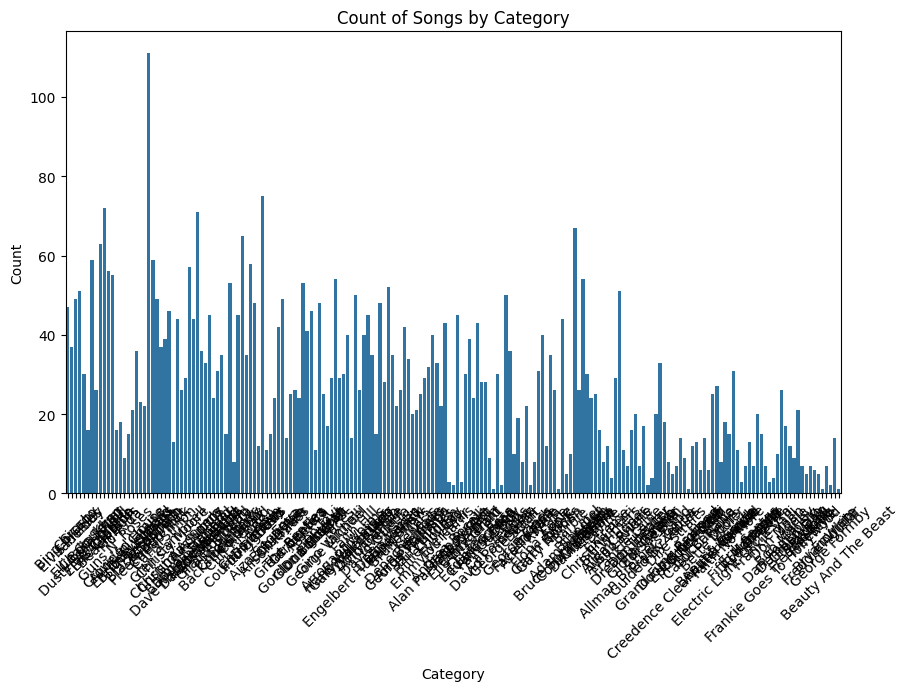

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='artist')
plt.title('Count of Songs by Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


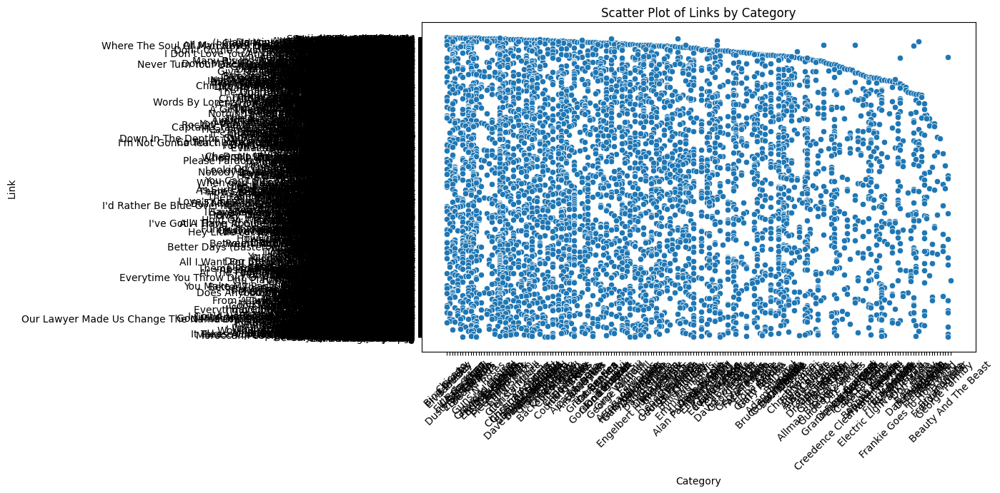

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='artist', y='song')
plt.title('Scatter Plot of Links by Category')
plt.xlabel('Category')
plt.ylabel('Link')
plt.xticks(rotation=45)
plt.show()


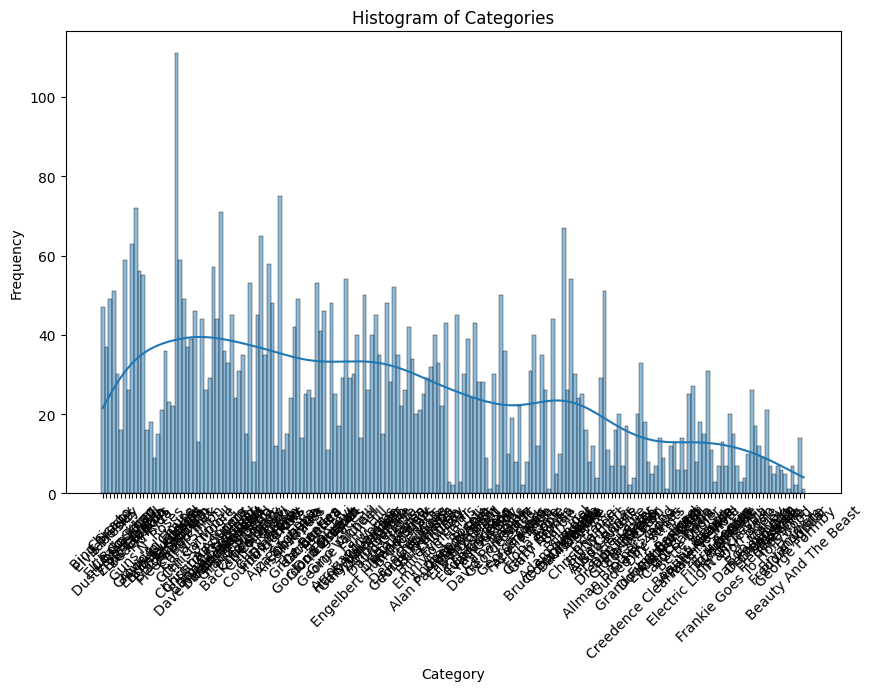

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='artist', bins=10, kde=True)
plt.title('Histogram of Categories')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Reduce the figure size and dpi
plt.figure(figsize=(8, 6), dpi=80)

# Your plotting code here

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting the first 2000 songs
df_subset = df.head(2000)

# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='song', bins=10, kde=True)
plt.title('Histogram of Categories')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example 1: Scatter plot with different markers for each category
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='artist', y='link', style='text', markers=['o', 's', '^'])
plt.title('Scatter Plot of Links by Category with Text Style')
plt.xlabel('Category')
plt.ylabel('Link')
plt.xticks(rotation=45)
plt.legend(title='Text')
plt.show()

# Example 2: Scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(data=df, x='artist', y='link', scatter_kws={'s': 100, 'alpha': 0.5})
plt.title('Scatter Plot of Links by Category with Regression Line')
plt.xlabel('Category')
plt.ylabel('Link')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting the first 2000 songs
df_subset = df.head(2000)

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='artist', y='text', palette='Set2')
plt.title('Scatter Plot of Text by Category')
plt.xlabel('Category')
plt.ylabel('Text')
plt.xticks(rotation=45)
plt.show()


<ipython-input-47-e5dc09c4c3ce>:9: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, x='artist', y='text', palette='Set2')
) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


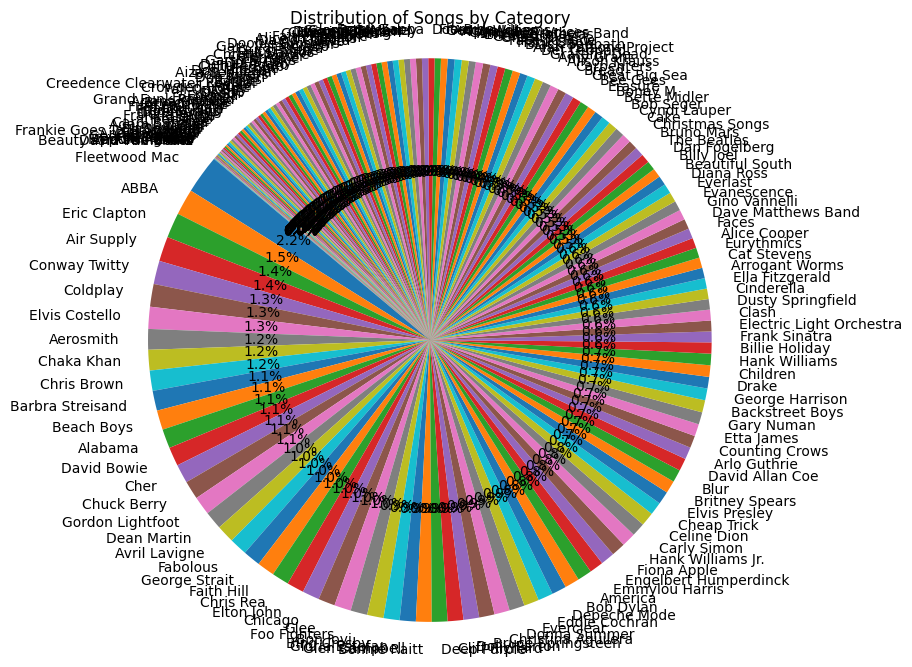

In [44]:
import matplotlib.pyplot as plt

# Count the number of songs in each category
category_counts = df['artist'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Songs by Category')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


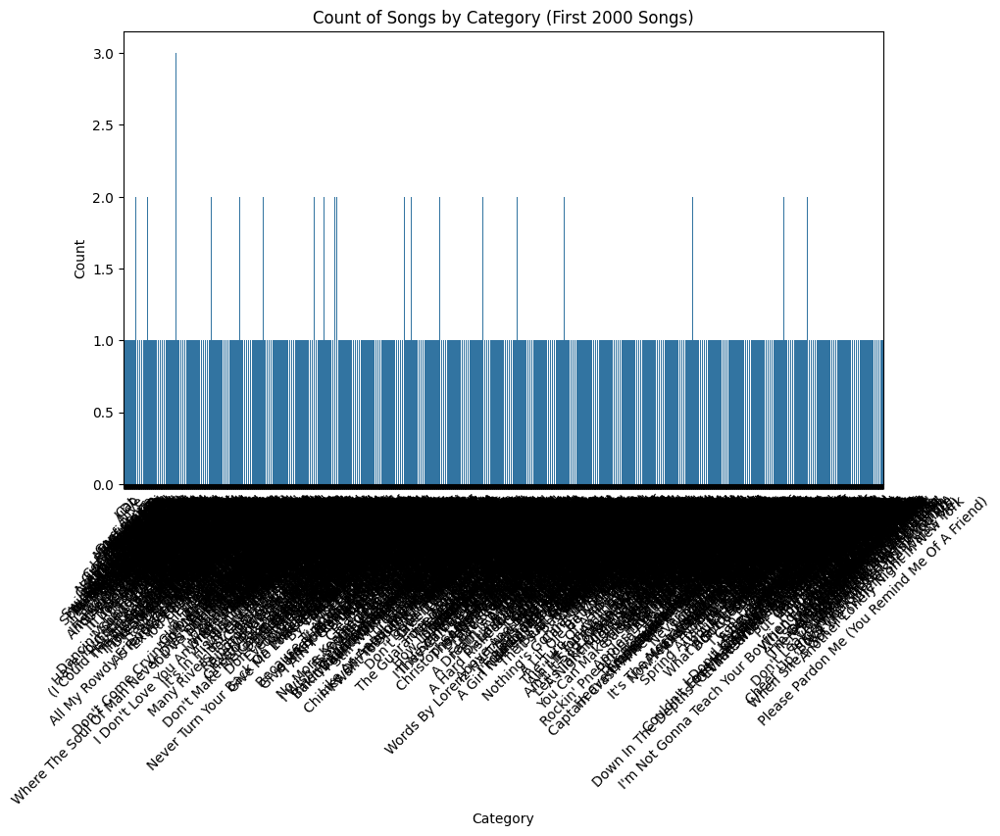

) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


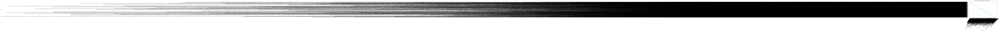

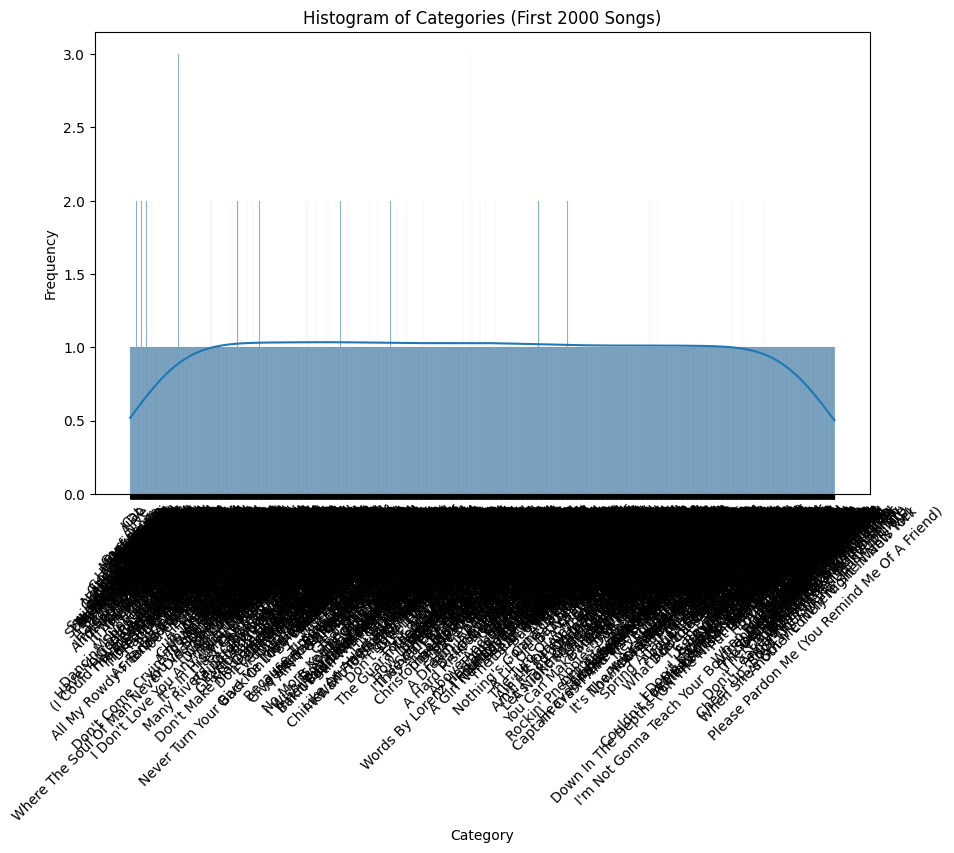

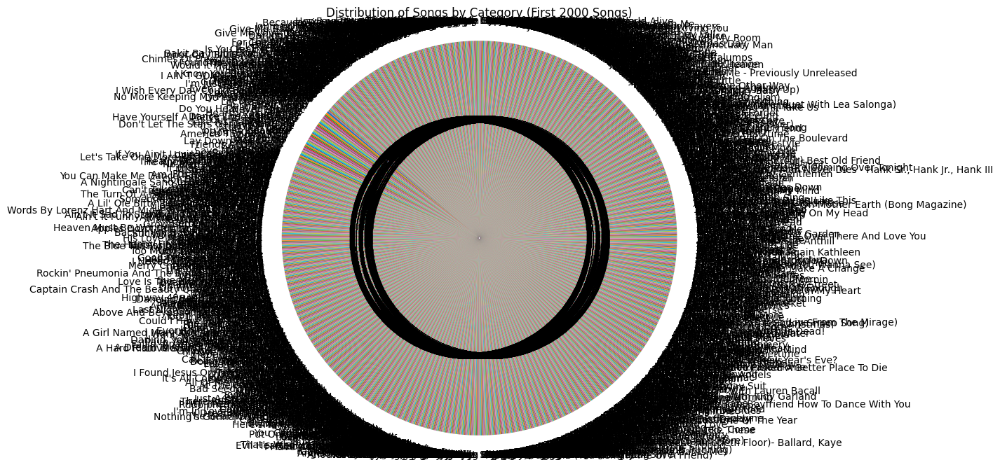

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting the first 2000 songs
df_subset = df.head(2000)

# Bar plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df_subset, x='song')
plt.title('Count of Songs by Category (First 2000 Songs)')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_subset, x='song', y='text')
plt.title('Scatter Plot of Text by Category (First 2000 Songs)')
plt.xlabel('Category')
plt.ylabel('Text')
plt.xticks(rotation=45)
plt.show()

# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(data=df_subset, x='song', bins=10, kde=True)
plt.title('Histogram of Categories (First 2000 Songs)')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Pie chart
plt.figure(figsize=(8, 8))
category_counts = df_subset['song'].value_counts()
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Songs by Category (First 2000 Songs)')
plt.axis('equal')
plt.show()
